# Patagonia trip in python - map with pictures and diary

In [1]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.colors as mcolors  # Correct import for rgb2hex
import seaborn as sns
import os
# define here some variables:
ROOT_GPX_FILES = '/Users/filippomichelon/Documents/PersonalCode/garmin_patagonia_gpx_files'


In [2]:
# define here the function to extract .gpx files from a folder and extract it
import gpxpy
import gpxpy.gpx
import pandas as pd
import os
from typing import List

def extract_gpx_files_from_folder(folder_path: str) -> pd.DataFrame:
    """
    Extracts multiple .gpx files from a specified folder and combines their data into a Pandas DataFrame.
    
    Parameters:
    folder_path (str): Path to the folder containing .gpx files.
    
    Returns:
    pd.DataFrame: DataFrame containing latitude, longitude, elevation, time, and file name.
    """
    data = []
    file_paths = [os.path.join(folder_path, f) for f in os.listdir(folder_path) if f.endswith('.gpx')]
    
    for file_path in file_paths:
        with open(file_path, 'r') as gpx_file:
            gpx = gpxpy.parse(gpx_file)
            for track in gpx.tracks:
                for segment in track.segments:
                    for point in segment.points:
                        data.append({
                            'latitude': point.latitude,
                            'longitude': point.longitude,
                            'elevation': point.elevation,
                            'time': point.time,
                            'file': os.path.basename(file_path)
                        })
    
    return pd.DataFrame(data)

df = extract_gpx_files_from_folder(ROOT_GPX_FILES)

In [3]:
df

,latitude,longitude,elevation,time,file
0,-47.513040,-72.864786,95.000000,2025-02-13 12:15:59+00:00,activity_18305731843.gpx
1,-47.513040,-72.864781,95.000000,2025-02-13 12:16:00+00:00,activity_18305731843.gpx
2,-47.512932,-72.864581,95.599998,2025-02-13 12:17:13+00:00,activity_18305731843.gpx
3,-47.512929,-72.864558,95.800003,2025-02-13 12:17:14+00:00,activity_18305731843.gpx
4,-47.512924,-72.864536,95.800003,2025-02-13 12:17:15+00:00,activity_18305731843.gpx
...,...,...,...,...,...
296851,-45.173780,-72.147552,101.199997,2025-02-23 17:38:13+00:00,activity_18367810592.gpx
296852,-45.173763,-72.147549,101.199997,2025-02-23 17:38:14+00:00,activity_18367810592.gpx
296853,-45.173755,-72.147546,101.199997,2025-02-23 17:38:15+00:00,activity_18367810592.gpx
296854,-45.173748,-72.147545,101.199997,2025-02-23 17:38:16+00:00,activity_18367810592.gpx


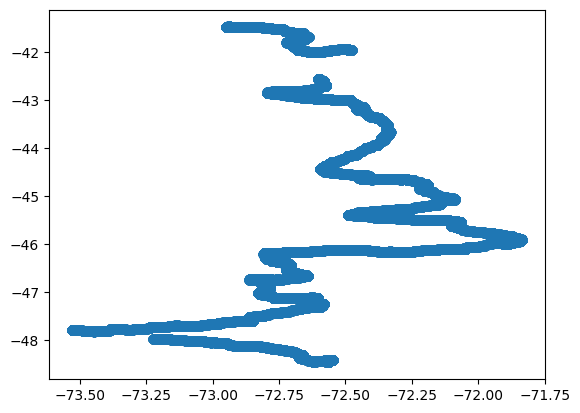

In [5]:
plt.figure()
plt.scatter(df.longitude,df.latitude)

In [ ]:
sns.color_palette()

In [11]:
import folium
import pandas as pd
import seaborn as sns
from folium.plugins import MarkerCluster

hex_colors = sns.color_palette("Paired", 10).as_hex()
m = folium.Map(location=(-45, -71), tiles="cartodb positron", zoom_start=6)

for day in df['file'].unique():
    day_track = df[df['file'] == day]
    trail_coordinates = list(zip(day_track.latitude, day_track.longitude))
    folium.PolyLine(trail_coordinates, color = hex_colors[9],weight=4, opacity = .3).add_to(m)
    # mark beginning of the day
    biking_day = f"Start biking day {day_track['time'].iloc[0].date()}"
    folium.CircleMarker(trail_coordinates[0], tooltip=biking_day,
                        radius=1, color=hex_colors[9], fill=True,
                        fill_color=hex_colors[5], fill_opacity=1
                       ).add_to(m)


m